In [1]:
%matplotlib inline
%env CUDA_VISIBLE_DEVICES = 1

env: CUDA_VISIBLE_DEVICES=1


In [14]:
%run mylibrary.ipynb
%run mymodel.ipynb

In [3]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import math
import random
from ast import literal_eval

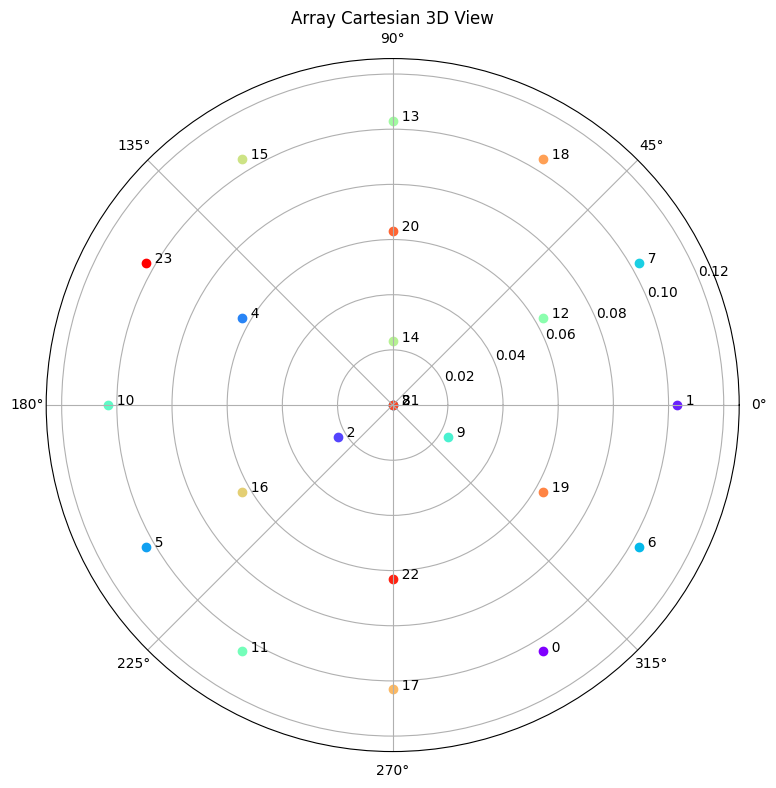

In [7]:
geometry = pd.read_csv('../tools/AA_geometry.tsv', header=None, sep='\t')
AA_Geometry = geometry.to_numpy()
visualizer = Visualizer(AA_Geometry)
visualizer.polar(fig_size=(10,9))

['random_signal_source_info_0.dat', 'random_signal_source_info_1.dat', 'random_signal_source_info_2.dat', 'random_signal_source_info_3.dat', 'random_signal_source_info_4.dat', 'random_signal_source_info_5.dat', 'random_signal_source_info_6.dat', 'random_signal_source_info_7.dat', 'random_signal_source_info_8.dat', 'random_signal_source_info_9.dat', 'random_signal_source_info_10.dat', 'random_signal_source_info_11.dat', 'random_signal_source_info_12.dat', 'random_signal_source_info_13.dat', 'random_signal_source_info_14.dat', 'random_signal_source_info_15.dat', 'random_signal_source_info_16.dat', 'random_signal_source_info_17.dat', 'random_signal_source_info_18.dat', 'random_signal_source_info_19.dat']
['random_signal_source_info_0_tau.bin', 'random_signal_source_info_1_tau.bin', 'random_signal_source_info_2_tau.bin', 'random_signal_source_info_3_tau.bin', 'random_signal_source_info_4_tau.bin', 'random_signal_source_info_5_tau.bin', 'random_signal_source_info_6_tau.bin', 'random_signal_

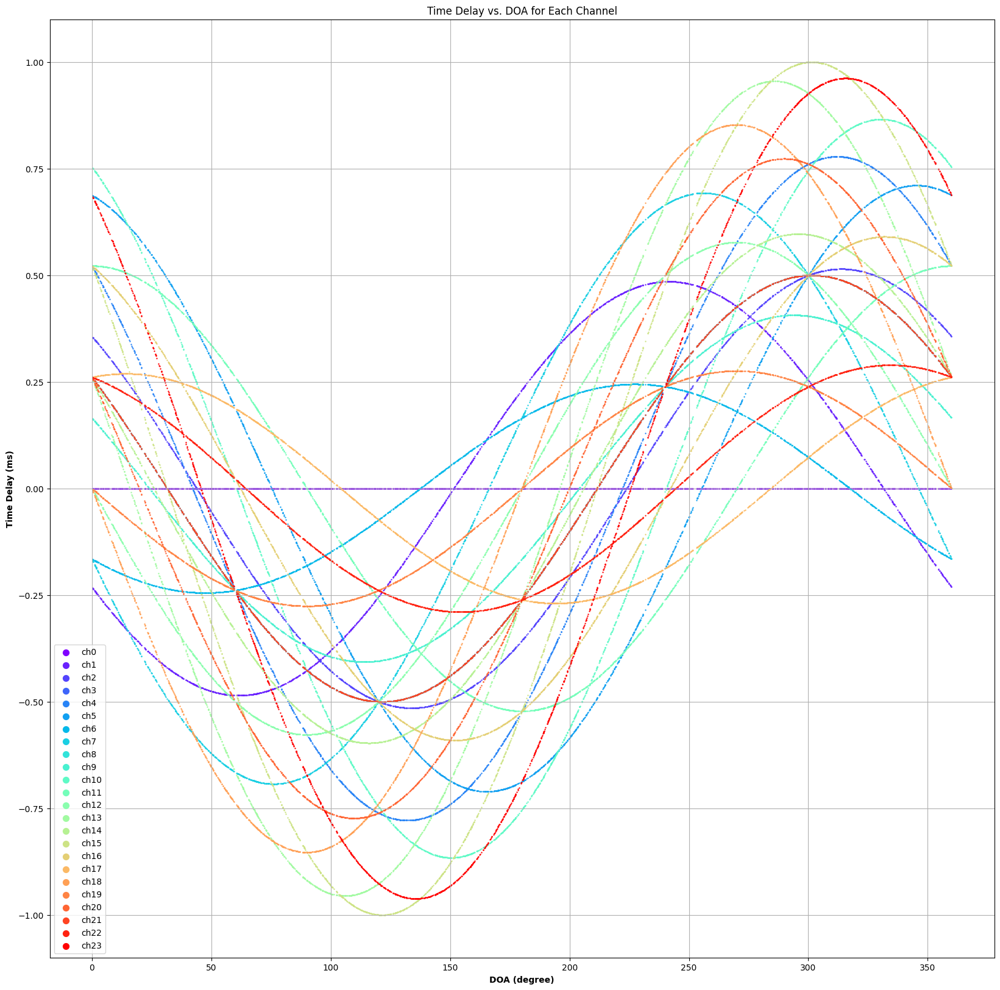

In [8]:
# Extract data from files
data = DataExtract("../data/rss360/", 24)
inputs, labels = data.get_delays_angles()
data.plot()

In [10]:
df_with_he = pd.read_csv("../plot/models_evaluation_with_weights_initialization.csv")
list_channels = [re.findall(r'\d+',item['Channels']) for i,item in df_with_he.iterrows()]
list_channels = [sorted([int(i) for i in ls]) for ls in list_channels]
list_channels

[[1, 14, 21],
 [12, 14, 20],
 [10, 11, 13],
 [8, 17, 22],
 [6, 11, 20],
 [7, 8, 21],
 [0, 12, 22],
 [8, 11, 13],
 [2, 10, 22],
 [7, 15, 22],
 [8, 16, 23],
 [1, 4, 14],
 [1, 5, 12],
 [7, 8, 11],
 [3, 11, 17],
 [6, 12, 13],
 [3, 7, 10],
 [4, 13, 23],
 [10, 13, 22],
 [4, 9, 15],
 [4, 16, 17],
 [3, 10, 13],
 [3, 10, 13],
 [8, 10, 15],
 [6, 16, 22],
 [15, 19, 21],
 [1, 13, 19],
 [5, 18, 21],
 [3, 4, 21],
 [7, 9, 11],
 [8, 15, 17],
 [0, 7, 18],
 [1, 14, 21],
 [17, 20, 22],
 [5, 13, 14],
 [4, 14, 22],
 [0, 15, 23],
 [5, 15, 23],
 [3, 7, 10],
 [0, 2, 12],
 [2, 10, 19],
 [3, 9, 20],
 [6, 15, 21],
 [3, 12, 20],
 [10, 12, 13],
 [0, 7, 17],
 [10, 11, 18],
 [13, 14, 16],
 [5, 12, 22],
 [15, 19, 23],
 [0, 2, 4, 6, 14, 23],
 [2, 4, 5, 6, 10, 16],
 [1, 5, 6, 15, 16, 22],
 [2, 5, 9, 13, 17, 22],
 [2, 10, 12, 14, 20, 23],
 [5, 6, 7, 13, 19, 23],
 [5, 11, 13, 15, 21, 22],
 [3, 8, 14, 15, 16, 17],
 [10, 14, 16, 17, 20, 21],
 [0, 1, 2, 13, 14, 15],
 [0, 2, 5, 7, 9, 18],
 [2, 3, 9, 10, 11, 15],
 [4, 8, 9, 1

In [11]:
# Get the list of channels with loss less than 55
# The 75 is a convience number from the results
top_with_he =  df_with_he.index[df_with_he['Loss'] < 55].tolist()
top_list_channels = [list_channels[i] for i in top_with_he]
top_list_channels.append(list(range(0,24)))
print(len(top_list_channels))
top_list_channels

15


[[6, 12, 13],
 [1, 13, 19],
 [0, 7, 18],
 [3, 12, 20],
 [12, 13, 15, 17, 19, 22],
 [2, 9, 10, 12, 17, 18],
 [2, 7, 9, 13, 19, 20],
 [8, 12, 16, 18, 21, 22],
 [2, 6, 8, 9, 12, 15, 18, 20, 22],
 [0, 2, 4, 8, 9, 12, 18, 19, 22],
 [1, 2, 3, 4, 9, 13, 17, 18, 22],
 [0, 3, 5, 6, 9, 12, 14, 15, 18, 19, 20, 23],
 [2, 3, 4, 6, 8, 10, 12, 13, 14, 15, 17, 18, 19, 22, 23],
 [0, 1, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23],
 [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23]]

2025-04-14 21:10:42.917207: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


[2.5124282836914062, 522.4237060546875, 3.7115859985351562]


2025-04-14 21:10:48.151350: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[3.236276865005493, 447.94134521484375, 4.430076599121094]


2025-04-14 21:10:53.271483: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[1.543878436088562, 19.03609275817871, 1.543878436088562]
[1.2247273921966553, 2.52453351020813, 1.2247273921966553]


2025-04-14 21:11:03.875702: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[1.0578711032867432, 6.713757514953613, 1.0578711032867432]
[1.9343420267105103, 5.472744941711426, 1.9343420267105103]
[0.727658212184906, 1.2922980785369873, 0.727658212184906]
[1.343337059020996, 7.581857204437256, 1.343337059020996]


2025-04-14 21:11:25.157598: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[1.9696741104125977, 7.547151565551758, 1.9696741104125977]
[2.802072286605835, 2292.034423828125, 8.94379997253418]
[1.0452663898468018, 25.05675506591797, 1.0452663898468018]


/tmp/ipykernel_1680688/1101515838.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt .subplots(ncols = 3, nrows=1, figsize=(12,3), layout="constrained")


[1.681200385093689, 435.699951171875, 2.880506992340088]
[2.7936384677886963, 443.1382751464844, 3.992243766784668]
[6.316322326660156, 817.7521362304688, 8.04260540008545]
[0.9044229984283447, 431.51654052734375, 2.0992660522460938]


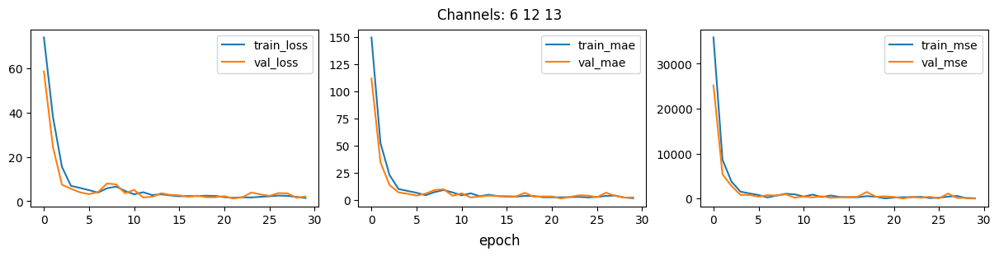

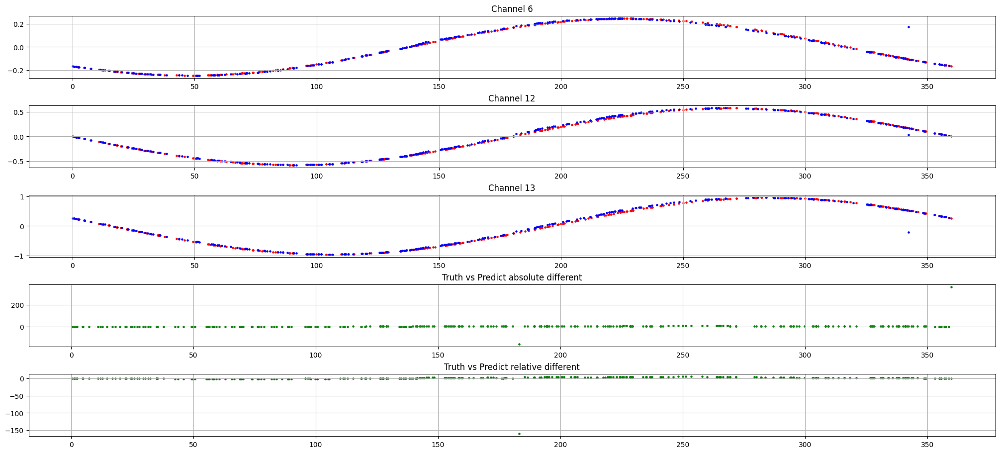

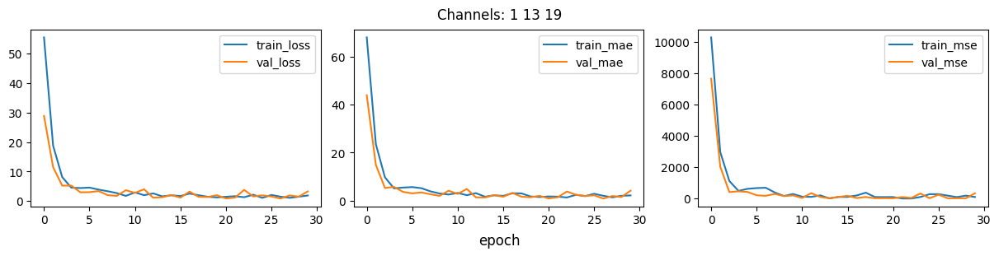

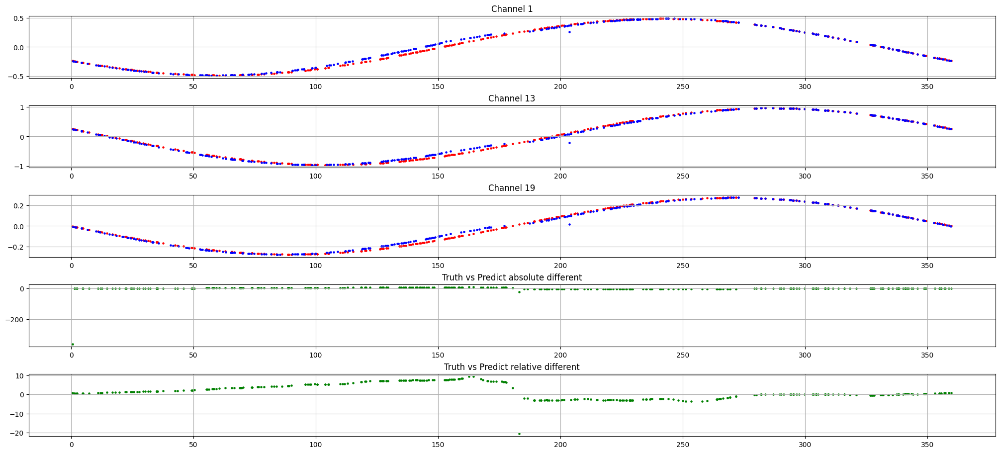

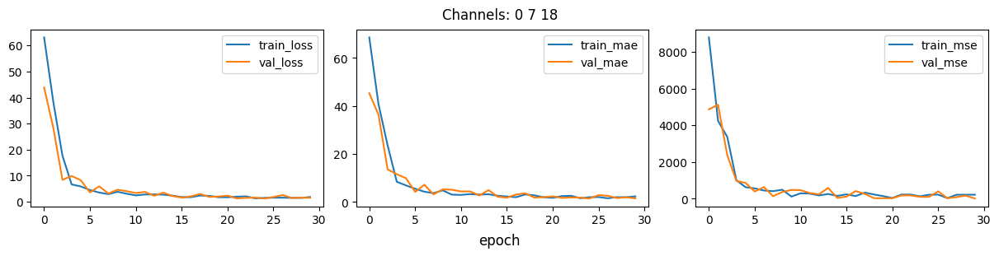

...

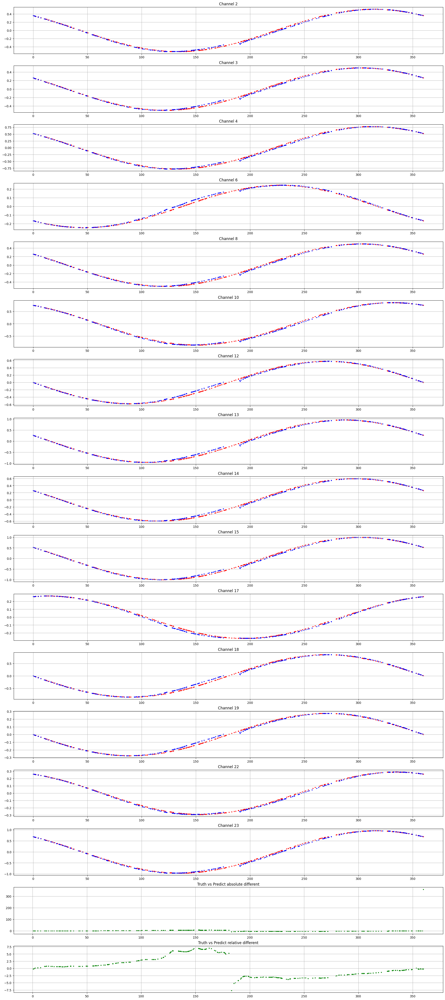

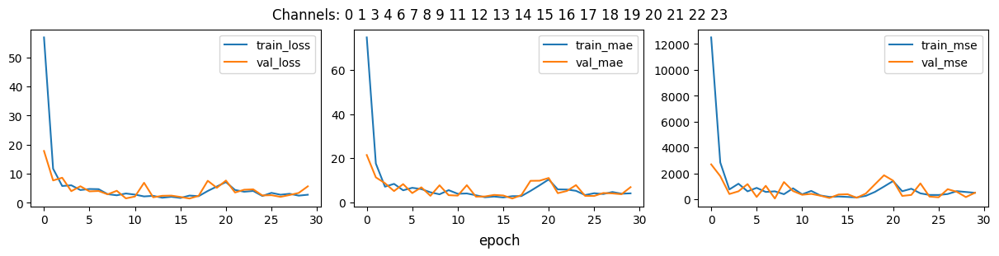

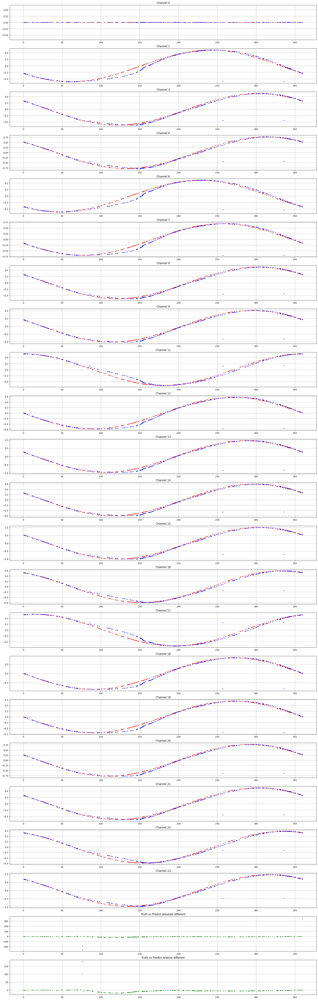

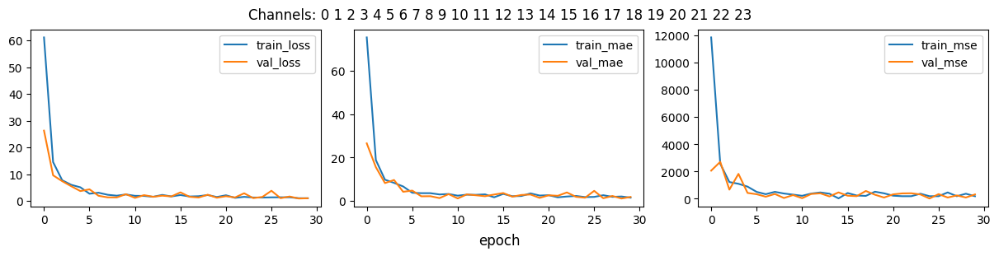

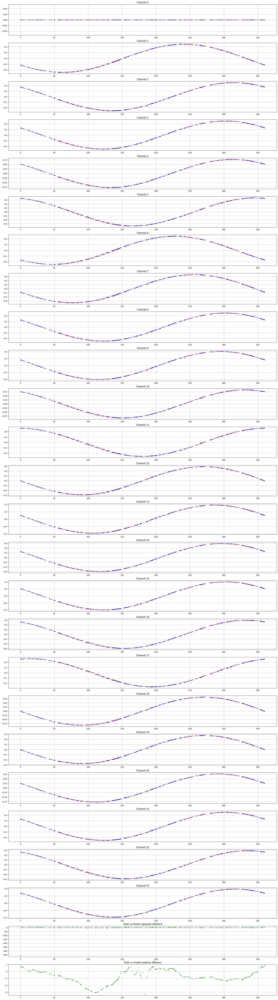

In [12]:
models, evaluates, losses = training_evaluation(top_list_channels, inputs, labels,\
                                                he_initializer=True, loss = 'selector',\
                                                floormod = True, epochs=30, plot=True)

[-1883146127671296.0, 3.611803099179231e+30, 1883146127671296.0]


2025-04-14 21:12:42.838930: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[-4384065318813696.0, 1.9539030236838258e+31, 4384065318813696.0]
[-5476685671563264.0, 3.050547802627853e+31, 5476684597821440.0]
[-911300859265024.0, 8.500338249343636e+29, 911300859265024.0]
[-2502996076265472.0, 6.66728694592857e+30, 2502996076265472.0]
[-3558735276408832.0, 1.338423898237855e+31, 3558735276408832.0]
[-2650510217707520.0, 7.616466590718259e+30, 2650510217707520.0]
[-3480467282067456.0, 1.2874509917647876e+31, 3480467282067456.0]
[-2626733278756864.0, 7.664723887122726e+30, 2626733278756864.0]
[-3399085168001024.0, 1.26336338659413e+31, 3399085168001024.0]
[-5188428941492224.0, 2.9672049401939483e+31, 5188428941492224.0]


/tmp/ipykernel_1680688/1101515838.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt .subplots(ncols = 3, nrows=1, figsize=(12,3), layout="constrained")


[-6550690562310144.0, 4.8741297109904595e+31, 6550690562310144.0]
[-8984569608929280.0, 9.322500893969695e+31, 8984569608929280.0]
[-5332301755973632.0, 3.322787016872691e+31, 5332301755973632.0]
[-1.9265799508197376e+16, 4.361154438648957e+32, 1.9265799508197376e+16]


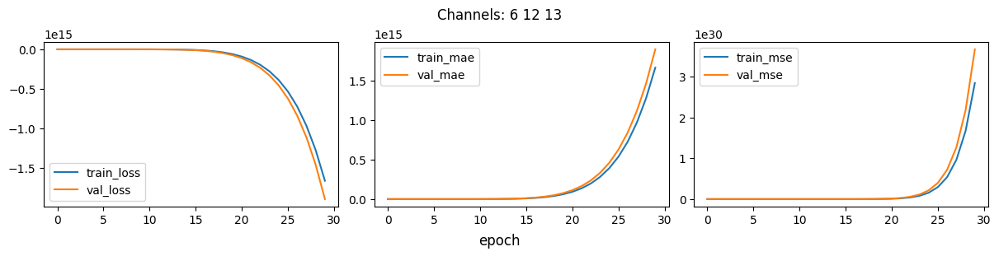

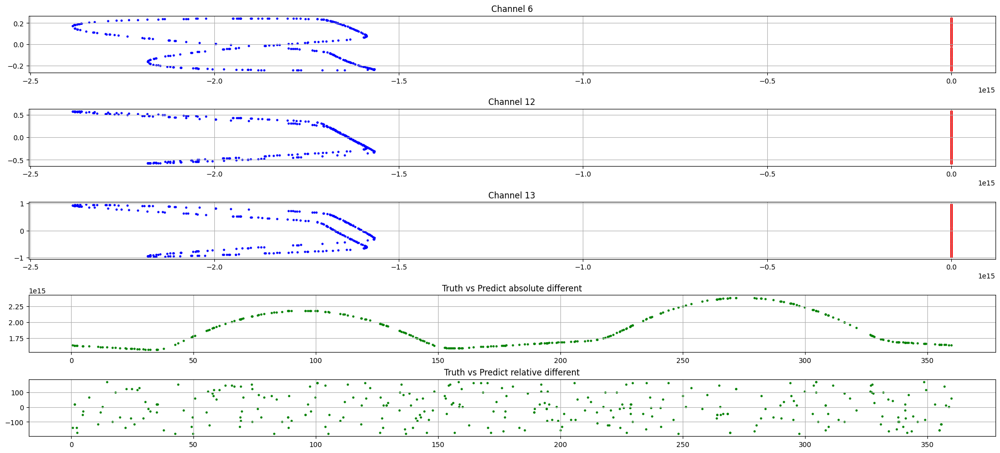

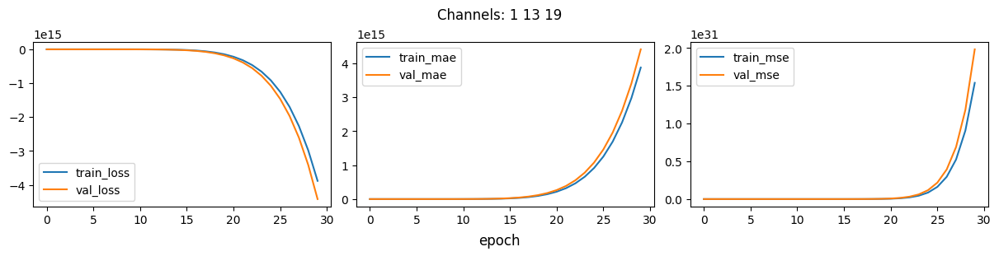

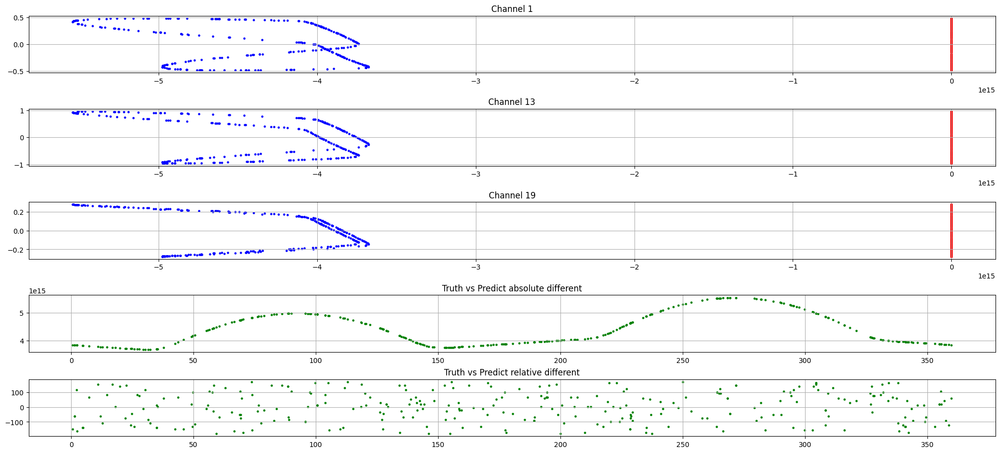

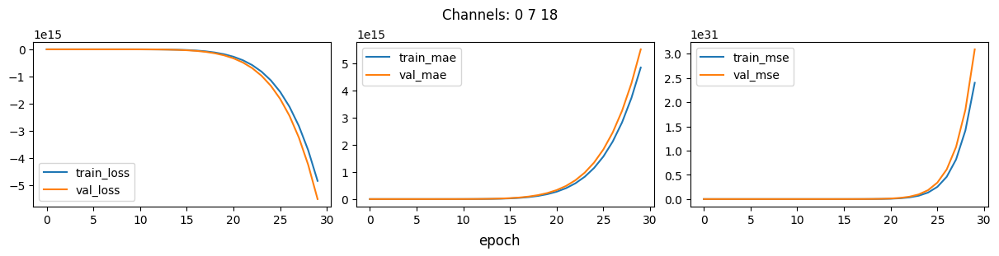

...

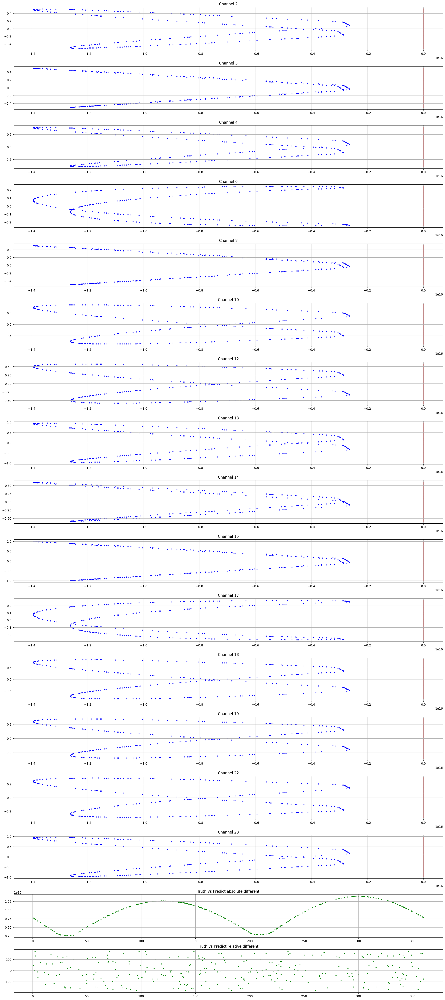

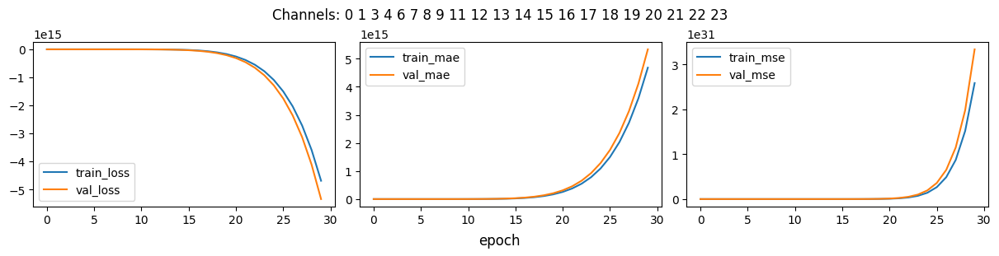

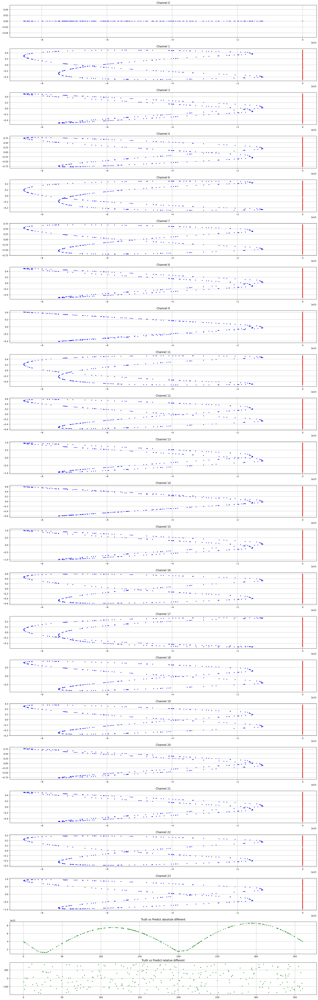

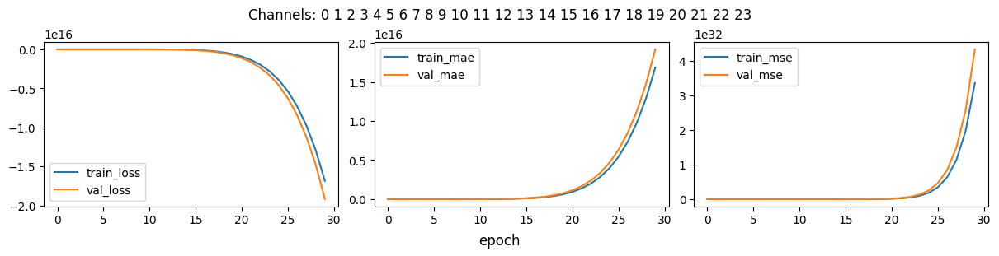

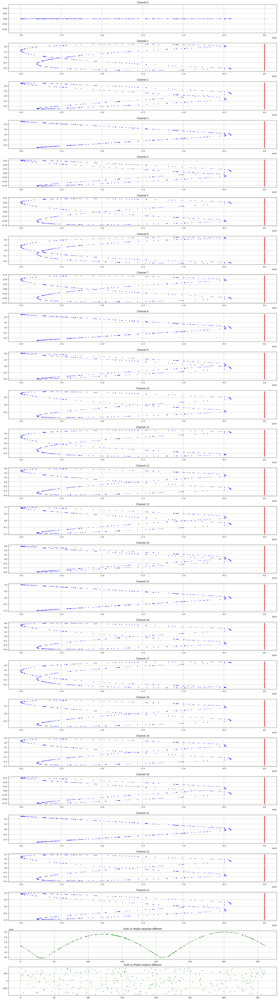

In [13]:
models, evaluates, losses = training_evaluation(top_list_channels, inputs, labels,\
                                                he_initializer=True, loss = 'selector',\
                                                floormod = False, epochs=30, plot=True)
evaluates